### DNN的基本结构

DNN的神经网络层可以分为三类：输入层，隐藏层和输出层。

一般来说第一层是输入层，最后一层是输出层，而中间的层数都是隐藏层。层与层之间是全连接的，也就是说，第$i$层的任意一个神经元都与第$i+1$层的任意一个神经元相连。


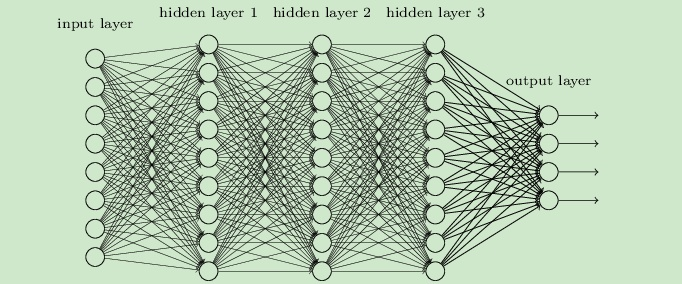

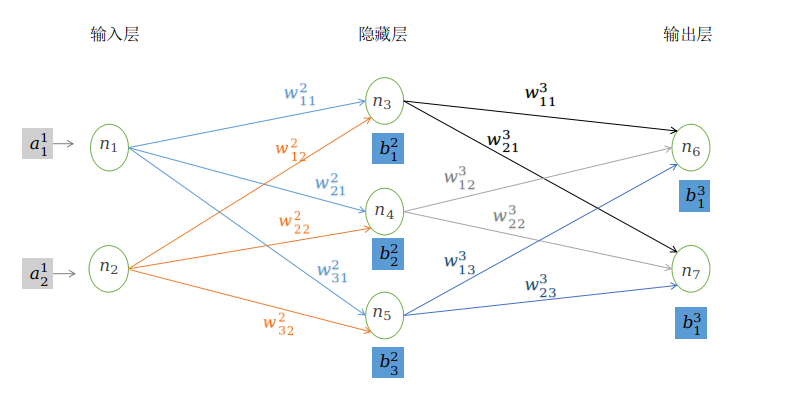

### 搭建神经网络

用$a^{l}$来表示第$l$层的神经元的输出值，并且$a^{l}$有多个分量。

第一层中的神经元$n_{1}$与$n_{2}$的输出值分别为：$a_{1}^{1}$、$a_{2}^{1}$。

$$a^{1}=[a_{1}^{1},a_{2}^{1}]$$

第二层的神经元$n_{3}$、$n_{4}$与$n_{5}$的输出值分别为：$a_{1}^{2}$，$a_{2}^{2}$，$a_{3}^{2}$。

$$a^{2}=[a_{1}^{2},a_{2}^{2},a_{3}^{2}]$$

第三层的神经元$n_{6}$与$n_{7}$的输出值分别为：$a_{1}^{3}$，$a_{2}^{3}$。

$$a^{3}=[a_{1}^{3},a_{2}^{3}]$$

用$w_{ij}^{l}$表示第$l$层的第个$i$（从上往下数）神经元对第$l-1$层的第个$j$神经元的输出值的加权权重。

用$b_{i}^{l}$表示第$l$层第$i$个神经元的偏移值。

因此第二层的神经元的输出值为：

$$a_{1}^{2}=\sigma(w_{11}^{2}a_{1}^{1}+w_{12}^{2}a_{2}^{1}+b_{1}^{2})~~~~~~~~~~~(1.1)$$

$$a_{2}^{2}=\sigma(w_{21}^{2}a_{1}^{1}+w_{22}^{2}a_{2}^{1}+b_{2}^{2})~~~~~~~~~~~(1.2)$$

$$a_{3}^{2}=\sigma(w_{31}^{2}a_{1}^{1}+w_{32}^{2}a_{2}^{1}+b_{3}^{2})~~~~~~~~~~~(1.3)$$

为了书写简单，将(1.1)-(1.3)写成向量形式。故

$$a^{2}=\sigma(w^{2}a^{1}+b^{2})$$

类似的，对第三层的输出值，得
$$a^{3}=\sigma(w^{3}a^{2}+b^{3})$$

综合上面两式，得

$$a^{3}=\sigma(w^{3}\sigma(w^{2}a^{1}+b^{2})+b^{3})$$

因此当输入$a^{1}$的时候，上图的神经网络的输出为$a^{3}$。

换句话说，当我们输入$x\in R^{2}$时，该神经网络相当于定义了一个关于$x$的函数，即

$$F(x)=a^{3}=\sigma(w^{3}\sigma(w^{2}x+b^{2})+b^{3})$$

只要我们确定了其中的参数$w^{2}$、$b^{2}$、$w^{3}$与$b^{3}$，我们就确定了神经网络,即确定了函数$F(x)$。

### 定义损失函数
为了确定神经网络中的参数，我们需要“训练”神经网络，因此，我们需要一定数量的训练样本。假设有$N$个训练样本，集合$\{{x_{i}}\}^{N}_{i=1}$为训练用的输入，而集合$\{y_{x_{i}}\}^{N}_{i=1}$为训练用的输出数据。“训练”神经网络的目的是要确定参数$w^{2}$、$b^{2}$、$w^{3}$与$b^{3}$使得输入$x_{i}$时，神经网络的输出值尽量接近$y_{x_{i}}$。我们用一个合适的损失函数来度量训练样本的输出损失，接着对这个损失函数进行优化求最小化的极值，对应的参数$w^{2}$、$b^{2}$、$w^{3}$与$b^{3}$为最终结果。

我们定义损失函数为：

$$
\begin{split}
\mathcal{L}\left(W^{2},W^{3}, b^{2},b^{3}\right)
&=\frac{1}{N}\sum_{i=1}^{N} \frac{1}{2}\left\|y_{x_{i}}-a^{3}\left(x_{i}\right)\right\|^{2}\\
&=\frac{1}{N}\sum_{i=1}^{N}\mathcal{L_{i}}\left(W^{2},W^{3}, b^{2},b^{3}\right)
\end{split}
$$
其中$
\mathcal{L}_{i}(W^{2},W^{3}, b^{2},b^{3})=\frac{1}{2}\left\|y_{x_{i}}-a^{3}\left(x_{i}\right)\right\|^{2}
$为每个样本的损失函数。因此，训练神经网络等价于求解下列优化问题
$$
\min _{W^{2},W^{3},b^{2},b^{3}} \mathcal{L}\left(W^{2},W^{3}, b^{2},b^{3}\right)~~~~~~~~(1.4)
$$

### 定义优化算法

#### 随机梯度下降算法
在DNN中，损失函数优化极值求解的过程最常见的一般是通过梯度下降法来一步步迭代完成的，也可以是其他的迭代方法比如牛顿法与拟牛顿法。这里讲述的是随机梯度下降算法。

为了方便说明，我们将 $W^{2},W^{3},b^{2},b^{3}$ 按某种方式组成一个向量 $p$， 因此，$(1.4)$ 可以重写为
$$
\min _{p} \mathcal{L}(p)_{\circ}
$$
一般的梯度下降算法使用下列迭代式求解 $(1.4):$
$$
p_{k+1}=p_{k}-\eta \nabla \mathcal{L}\left(p_{k}\right)=p_{k}-\eta \frac{1}{N} \sum_{i=1}^{N} \nabla \mathcal{L}_{i}(p_{k})~~~~~~~~~~(1.5)
$$
其中， $\eta$ 为步长(学习率)。从 $(1.5)$ 看出，梯度下降的每一步都需要计算所有$\mathcal{L}_{i}$的梯度，计算量非常的大。因此，随机梯度下降法在1到$N$个方向中随机选择一个方向$i$，并运用下列迭代式

$$
p_{k+1}=p_{k}-\eta \nabla \mathcal{L}_{i}\left(p_{k}\right)
~~~~~~~~~(1.6)
$$

因此，算法 $(1.6)$ 较 $(1.5)$ 每次更新的计算量更少。

#### 反向传播

使用随机梯度下降法，我们需要求$\mathcal{L}_{i}$对参数$W^{2},W^{3},b^{2},b^{3}$的导数。对于单个样本的损失函数$\mathcal{L}_{i}$可以被定义为

$$
\mathcal{L}_{i}(W^{2},W^{3},b^{2},b^{3})=\frac{1}{2}\left\|y_{x_{i}}-a^{3}\left(x_{i}\right)\right\|^{2}
$$

为了书写方便，我们考虑单个训练样本时候，去掉记号中对$x_{i}$的依赖，上述式子被重新书写为

$$
\mathcal{L}(W^{2},W^{3}, b^{2},b^{3})=\frac{1}{2}\left\|y-a^{3}\right\|^{2}
$$

从上述式子可以看出，$\mathcal{L}$仅依赖于神经网络最后一层的输出$a^{3}$,我们可以使用求导数的链式法则求$\mathcal{L}$对参数$W^{2},W^{3}, b^{2},b^{3}$的导数。

我们对$l=2,3$定义

$$z^{l}=W^{l}a^{l-1}+b^{l}~~~~~~~(1.7)$$

即$z^{l}$为第$l$层神经元的输入，相应地，$z^{l}$的第$i$个分量即为第$l$层的第$i$个神经元的输入。

从而第$l$层的输出$a^{l}$可表示为

$$a^{l}=\sigma (z^{l})$$

定义向量$\sigma ^{l}$使得其第$i$个分量$\sigma _{i}^{l}$满足

$$\sigma _{i}^{l}=\frac{\partial L}{\partial z_{i}^{l}}$$

有了上面的记号后，我们接下来看看如何使用链式法则求解$\mathcal{L}$对$W^{l}_{ij}$与$b^{l}_{i}$偏导数。

从(1.7)我们能得到($n_{l-1}$为第$l-1$层的神经元的数目)

$$
\begin{array}{c}
z_{i}^{l}=\sum_{j=1}^{n_{l-1}} W_{i j}^{l} a_{j}^{l-1}+b_{i}^{l} 
\end{array}
~~~~~~~~~(1.8)$$

因此

$$
\begin{array}{c}
\frac{\partial z_{i}^{l}}{\partial W_{i j}^{l}}=a_{j}^{l-1}
\end{array}
~~~~~~~~~(1.9)$$

如果$s \neq i$, 我们有

$$
\frac{\partial z_{s}^{l}}{\partial W_{i j}^{l}}=0
~~~~~~~~~(1.10)
$$

因此，使用求导的链式法则，从 $(1.8)-(1.10)$, 我们得到

$$
\frac{\partial \mathcal{L}}{\partial W_{i j}^{l}}=\sum_{s=1}^{n_{l}} \frac{\partial \mathcal{L}}{\partial z_{s}^{l}} \frac{\partial z_{s}^{l}}{\partial W_{i j}^{l}}=\frac{\partial \mathcal{L}}{\partial z_{i}^{l}} \frac{\partial z_{i}^{l}}{\partial W_{i j}^{l}}=\delta_{i}^{l} a_{j}^{l-1}
~~~~~~~(1.11)
$$

类似的有

$$
\frac{\partial z_{i}^{l}}{\partial b_{i}^{l}}=1
~~~~~~~~~(1.12)
$$

因此，使用链式法则，我们有

$$
\frac{\partial \mathcal{L}}{\partial b_{i }^{l}}=\frac{\partial \mathcal{L}}{\partial z_{i}^{l}} \frac{\partial z_{i}^{l}}{\partial b_{i }^{l}}=\frac{\partial \mathcal{L}}{\partial z_{i}^{l}} =\delta_{i}^{l} 
~~~~~~~(1.13)
$$

求损失函数$\mathcal{L}$对于参数$W^{l}$与$b^{l}$的偏导数，我们需要知道如何更新$\sigma ^{l}$，即我们需要知道$\mathcal{L}$对$z^{l}$的导数。我们使用反向传播的方法。首先推导$\mathcal{L}$对最后一层变量$z^{l}_{i}$的偏导数，即求$\sigma ^{L}_{i}，L=3$。我们知道

$$
a_{i}^{L}=\sigma\left(z_{i}^{L}\right)
~~~~~~~(1.14)
$$

因此

$$
\frac{\partial a_{i}^{L}}{\partial z_{i}^{L}}=\sigma^{\prime}\left(z_{i}^{L}\right)
~~~~~~~(1.15)
$$

又因为$\mathcal{L}=\frac{1}{2}\left\|y-a^{L}\right\|^{2}$，我们可以得到

$$
\frac{\partial \mathcal{L}}{\partial a_{i}^{L}}=-\left(y_{i}-a_{i}^{L}\right)
~~~~~~~(1.16)
$$

所以，使用链式法则，我的得到

$$
\delta_{i}^{L}=\frac{\partial \mathcal{L}}{\partial z_{i}^{L}}=\frac{\partial \mathcal{L}}{\partial a_{i}^{L}} \frac{\partial a_{i}^{L}}{\partial z_{i}^{L}}=\left(a_{i}^{L}-y_{i}\right) \sigma^{\prime}\left(z_{i}^{L}\right)
~~~~~~~(1.17)
$$

将 $(1.17)$ 写成向量形式，我们有

$$
\delta^{L}=\sigma^{\prime}\left(z^{L}\right) \circ\left(a^{L}-y\right)
~~~~~~~(1.18)
$$

这里使用符号 $\circ$ 来表示向量的逐点相乘，例如 $\left(x_{1}, x_{2}\right) \circ\left(y_{1}, y_{2}\right)=\left(x_{1} y_{1}, x_{2} y_{2}\right)$ 。

接下来，对 $l<L$ ，我们在知道 $\delta_{i}^{l+1}$ 的情况下，求解 $\delta_{i}^{l} $ 。继续使用链式法则，我们得到

$$
\delta_{i}^{l}=\frac{\partial \mathcal{L}}{\partial z_{i}^{l}}=\sum_{k=1}^{n_{l+1}} \frac{\partial \mathcal{L}}{\partial z_{k}^{l+1}} \frac{\partial z_{k}^{l+1}}{\partial z_{i}^{l}}=\sum_{k=1}^{n_{l+1}} \delta_{k}^{l+1} \frac{\partial z_{k}^{l+1}}{\partial z_{i}^{l}}
~~~~~~~(1.19)
$$

因此，我们需要求 $z_{k}^{l+1}$ 对 $z_{i}^{l}$ 的偏导。从$z^{l}$的定义中，我们知道

$$
z_{k}^{l+1}=\sum_{s=1}^{n_{l}} W_{k s}^{l+1} \sigma\left(z_{s}^{l}\right)+b_{k}^{l+1}
~~~~~~~(1.20)
$$

我们将 $z_{k}^{l+1}$ 对 $z_{i}^{l}$ 求偏导，我们得到

$$
\frac{\partial z_{k}^{l+1}}{\partial z_{i}^{l}}=W_{k i}^{l+1} \sigma^{\prime}\left(z_{i}^{l}\right)
~~~~~~~(1.21)
$$

所以，从 $(1.19)$ 与 $(1.21)$, 我们可以得到

$$
\delta_{i}^{l}=\sum_{k=1}^{n_{l+1}} \delta_{k}^{l+1} W_{k i}^{l+1} \sigma^{\prime}\left(z_{i}^{l}\right)
~~~~~~~(1.22)
$$

我们可以将 $(1.22)$ 重写为

$$
\delta_{i}^{l}=\sigma^{\prime}\left(z_{i}^{l}\right)\left(\left(W^{l+1}\right)^{T} \delta^{l+1}\right)_{i}
~~~~~~~(1.23)
$$

我们将 $(1.23)$ 写成向量的形式，得到

$$
\delta^{l}=\sigma^{\prime}\left(z^{l}\right) \circ\left(\left(W^{l+1}\right)^{T} \delta^{l+1}\right) 
~~~~~~~(1.24)
$$

综合 $(1.11)，(1.13)，(1.18)，(1.24)$， 在反向传播中，我们使用下列公式更新 $\mathcal{L}$ 对 $W^{l}$ 与 $b^{l}$ 的偏导数。

反向传播更新公式：

$$
\begin{array}{c}
\delta^{L}=\sigma^{\prime}\left(z^{L}\right) \circ\left(a^{L}-y\right)\\
\delta^{l}=\sigma^{\prime}\left(z^{l}\right) \circ\left(\left(W^{l+1}\right)^{T} \delta^{l+1}\right) \\
\frac{\partial \mathcal{L}}{\partial b_{i}^{l}}=\delta_{i}^{l} \\
\frac{\partial \mathcal{L}}{\partial W_{i j}^{l}}=\delta_{i}^{l} a_{j}^{l-1}
\end{array}
$$

### 使用DNN求解抛物方程

从上面可以看出神经网络可以看做一个函数$u_{\theta}$，所以我们可以使用$u_{\theta}$来近似偏微分方程中的函数u，一旦确定参数$\theta$,就得到偏微分方程的近似解。这里考虑下列的热传导方程的求解

$$
\begin{split}
u_t-u_{xx}-u_{yy}&=(\pi+2\pi^{2})(cos(\pi t)\\
&+sin(\pi t))sin(\pi x)sin(\pi y)~~&on~[0,4]\times[0,1]\times[0,1] \\
u(0,x,y)&=0~~&on~[0,1]\times[0,1]\\
u(t,0,y)&=u(t,1,y)=0~~&on~[0,4]\times[0,1]\\
u(t,x,0)&=u(t,x,1)=0~~&on~[0,4]\times[0,1]
\end{split}
$$

解析解为：

$$u(t,x,y)=sin(\pi t)sin(\pi x)sin(\pi y)$$

我们需要训练神经网络，寻找合适的参数$\theta$。为此，我们要构造优化问题，使得对每一个输入$(t,x,y)$，$u_{\theta}(t,x,y)$与解析解更接近。我们定义损失函数

$$MSE=MSE_{u}+MSE_{f}$$

其中

$$
\begin{split}
MSE_{u}&=\frac{1}{N_{u}}\sum_{i=1}^{N_{u}}|u_{\theta}(t_{u}^{i},x_{u}^{i},y_{u}^{i})-u^{i}|^{2}\\
MSE_{f}&=\frac{1}{N_{f}}\sum_{i=1}^{N_{f}}|f(t_{f}^{i},x_{f}^{i},y_{f}^{i})|^{2}
\\
f(t,x,y) :&= {u_{\theta}}_t-{u_{\theta}}_{xx}-{u_{\theta}}_{yy}\\
&-(\pi+2\pi^{2})(cos(\pi t)+sin(\pi t))sin(\pi x)sin(\pi y)
\end{split}
$$

这里$\{t^{i}_{u},x_{u}^{i},y_{u}^{i},u^{i}\}_{i=1}^{N_{u}}$指初始和边界的训练数据，$\{t^{i}_{f},x_{f}^{i},y_{f}^{i}\}_{i=1}^{N_{f}}$指区域内部的训练数据。

那么$u_{\theta}$大致满足(2.1)中的偏微分方程、初始条件和边界条件。因此，求解热传导方程的解的过程，即训练神经网络$u_{\theta}$的过程，即求解下列优化问题

$$\min_{\theta}MSE$$

程序设计

In [1]:
import torch 
import matplotlib.pyplot as plt
import numpy as np
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import norm
from matplotlib import cm
import torch.utils.data as Data

构建神经网络

In [2]:

class Net(nn.Module):
    # NL: 隐藏层个数
    # NN: 每层的神经元个数
    def __init__(self, NL, NN):
        super(Net, self).__init__()

        self.input_layer = nn.Linear(3, NN) #3--->t、x、y

        self.hidden_layers = nn.ModuleList([nn.Linear(NN, NN) for i in range(NL)])

        self.output_layer = nn.Linear(NN, 1)#1指输出函数值
        
    def forward(self, x):
        o = self.act(self.input_layer(x))   #输入层使用激励函数

        for i, li in enumerate(self.hidden_layers):
            o = self.act(li(o))     #遍历所有的隐藏层，使用激励函数
        
        out = self.output_layer(o)  #输出层，输出结果
        
        return out

    def act(self, x):#定义激励函数
        return  x*torch.sigmoid(x)

定义损失函数

In [3]:

def mseloss(f_int,f_ini,f_bl,f_br,f_bu,f_bd,net):
    
    f_int = Variable(f_int, requires_grad=True)
                                       
    d = torch.autograd.grad(net(f_int), f_int, 
                            grad_outputs=torch.ones_like(net(f_int)),
                            create_graph=True)
    dt = d[0][:, 0].reshape(-1, 1)  # transform the vector into a column vector
    dx = d[0][:, 1].reshape(-1, 1)
    dy = d[0][:, 2].reshape(-1, 1)
    dxx = torch.autograd.grad(dx, f_int, grad_outputs=torch.ones_like(dx), 
                              create_graph=True)[0][:, 1].reshape(-1, 1)
    dyy = torch.autograd.grad(dy, f_int, grad_outputs=torch.ones_like(dy),
                              create_graph=True)[0][:, 2].reshape(-1, 1)
   
    f = (np.pi * (torch.cos(np.pi*f_int[:, 0])) 
         * (torch.sin(np.pi*f_int[:, 1])) * (torch.sin(np.pi*f_int[:, 2]))
         + 2 * np.pi * np.pi * (torch.sin(np.pi*f_int[:, 0])) 
         * (torch.sin(np.pi*f_int[:, 1])) * (torch.sin(np.pi*f_int[:, 2])))

    inter_error = (dt - dxx - dyy - f.reshape(-1, 1))**2

    init_error = (net(f_ini)) ** 2

    bd_left_error = (net(f_bl)) ** 2
    bd_right_error = (net(f_br)) ** 2
    bd_up_error = (net(f_bu)) ** 2
    bd_down_error = (net(f_bd)) ** 2

    loss = torch.mean(inter_error + init_error 
                      + bd_left_error + bd_right_error 
                      + bd_up_error + bd_down_error)
    return loss


产生样本数据

In [4]:
nt = 4
nx = 1
ny = 1
num_examples = 2**8

#随机产生内部点
f_interior=torch.cat((torch.rand(num_examples, 1)*nt,
                      torch.rand([num_examples, 1])*nx,
                      torch.rand([num_examples, 1])*ny), dim=1)

#随机产生初始点
f_initial = torch.cat((torch.zeros(num_examples, 1),
                       torch.rand([num_examples, 1])*nx, 
                       torch.rand([num_examples, 1])*ny), dim=1)

#随机产生左边界点
f_boundary_left = torch.cat((torch.rand([num_examples, 1])*nt, 
                             torch.zeros([num_examples, 1]), 
                             torch.rand(num_examples, 1)*ny), dim=1)

#随机产生右边界点
f_boundary_right = torch.cat((torch.rand([num_examples, 1])*nt, 
                              torch.ones([num_examples, 1])*nx,
                              torch.rand(num_examples, 1)*ny), dim=1)

#随机产生上边界点
f_boundary_up = torch.cat((torch.rand([num_examples, 1])*nt, 
                           torch.rand([num_examples, 1])*nx, 
                           torch.ones(num_examples, 1)*ny), dim=1)

#随机产生下边界点
f_boundary_down = torch.cat((torch.rand([num_examples, 1])*nt, 
                             torch.rand([num_examples, 1])*nx,
                             torch.zeros(num_examples, 1)), dim=1)


读取数据

In [5]:
batch_size = 2**8
#将训练数据的特征组合
dataset = Data.TensorDataset(f_interior,f_initial,
                             f_boundary_left,f_boundary_right,
                             f_boundary_up,f_boundary_down)
data_iter = Data.DataLoader(dataset,batch_size,shuffle=True)

训练模型

In [8]:
num_epochs = 10**5
nh = 4
nm = 20
net = Net(nh,nm)

#定义优化算法
optimizer = optim.Adam(net.parameters(),lr=0.0001)

for epoch in range(1,num_epochs+1):
    for f1,f2,f3,f4,f5,f6 in data_iter:
        l=mseloss(f_int=f1,f_ini=f2,f_bl=f3,f_br=f4,f_bu=f5,f_bd=f6,net=net)
        optimizer.zero_grad()
        l.backward()
        optimizer.step()
    if epoch % 50 == 49:
        print('epoch%d,loss:%f'%(epoch,l.item()))

        

epoch49,loss:56.009319
epoch99,loss:55.987312
epoch149,loss:55.954723
epoch199,loss:55.891861
epoch249,loss:55.766548
epoch299,loss:55.540207
epoch349,loss:55.169907
epoch399,loss:54.619949
epoch449,loss:53.872131
epoch499,loss:52.942738
epoch549,loss:51.912548
epoch599,loss:50.866013
epoch649,loss:49.672501
epoch699,loss:47.668602
epoch749,loss:44.602566
epoch799,loss:41.640419
epoch849,loss:39.591293
epoch899,loss:37.888191
epoch949,loss:36.310513
epoch999,loss:35.066833
epoch1049,loss:34.155937
epoch1099,loss:33.369675
epoch1149,loss:32.662849
epoch1199,loss:32.006836
epoch1249,loss:31.340466
epoch1299,loss:30.569540
epoch1349,loss:29.798185
epoch1399,loss:29.007233
epoch1449,loss:28.083956
epoch1499,loss:26.891251
epoch1549,loss:25.426128
epoch1599,loss:24.019506
epoch1649,loss:22.946461
epoch1699,loss:22.307570
epoch1749,loss:21.808720
epoch1799,loss:21.292828
epoch1849,loss:20.755009
epoch1899,loss:20.164988
epoch1949,loss:19.524557
epoch1999,loss:18.868954
epoch2049,loss:18.1895

epoch16799,loss:0.059704
epoch16849,loss:0.059139
epoch16899,loss:0.059029
epoch16949,loss:0.059149
epoch16999,loss:0.058842
epoch17049,loss:0.058808
epoch17099,loss:0.058635
epoch17149,loss:0.058695
epoch17199,loss:0.058424
epoch17249,loss:0.058720
epoch17299,loss:0.058244
epoch17349,loss:0.058206
epoch17399,loss:0.058099
epoch17449,loss:0.058586
epoch17499,loss:0.057929
epoch17549,loss:0.057750
epoch17599,loss:0.058157
epoch17649,loss:0.057563
epoch17699,loss:0.057468
epoch17749,loss:0.057503
epoch17799,loss:0.057283
epoch17849,loss:0.057191
epoch17899,loss:0.057502
epoch17949,loss:0.057012
epoch17999,loss:0.056919
epoch18049,loss:0.057531
epoch18099,loss:0.056755
epoch18149,loss:0.056653
epoch18199,loss:0.056564
epoch18249,loss:0.056794
epoch18299,loss:0.056395
epoch18349,loss:0.056308
epoch18399,loss:0.056223
epoch18449,loss:0.056527
epoch18499,loss:0.056054
epoch18549,loss:0.055968
epoch18599,loss:0.056194
epoch18649,loss:0.055799
epoch18699,loss:0.055714
epoch18749,loss:0.060596


epoch33199,loss:0.041075
epoch33249,loss:0.041044
epoch33299,loss:0.041066
epoch33349,loss:0.040995
epoch33399,loss:0.040957
epoch33449,loss:0.040927
epoch33499,loss:0.040995
epoch33549,loss:0.041084
epoch33599,loss:0.040840
epoch33649,loss:0.040809
epoch33699,loss:0.042996
epoch33749,loss:0.040762
epoch33799,loss:0.040723
epoch33849,loss:0.040774
epoch33899,loss:0.040859
epoch33949,loss:0.040637
epoch33999,loss:0.040608
epoch34049,loss:0.047091
epoch34099,loss:0.040576
epoch34149,loss:0.040523
epoch34199,loss:0.040493
epoch34249,loss:0.041138
epoch34299,loss:0.040449
epoch34349,loss:0.040409
epoch34399,loss:0.040381
epoch34449,loss:0.040873
epoch34499,loss:0.040425
epoch34549,loss:0.040318
epoch34599,loss:0.040276
epoch34649,loss:0.040315
epoch34699,loss:0.040216
epoch34749,loss:0.040185
epoch34799,loss:0.041434
epoch34849,loss:0.040137
epoch34899,loss:0.040102
epoch34949,loss:0.040353
epoch34999,loss:0.040179
epoch35049,loss:0.040095
epoch35099,loss:0.040125
epoch35149,loss:0.039965


epoch49599,loss:0.033284
epoch49649,loss:0.033410
epoch49699,loss:0.033239
epoch49749,loss:0.037103
epoch49799,loss:0.033221
epoch49849,loss:0.033175
epoch49899,loss:0.033156
epoch49949,loss:0.033999
epoch49999,loss:0.033115
epoch50049,loss:0.033093
epoch50099,loss:0.036327
epoch50149,loss:0.033078
epoch50199,loss:0.033041
epoch50249,loss:0.033071
epoch50299,loss:0.032995
epoch50349,loss:0.033027
epoch50399,loss:0.033010
epoch50449,loss:0.032947
epoch50499,loss:0.032938
epoch50549,loss:0.032891
epoch50599,loss:0.033251
epoch50649,loss:0.032851
epoch50699,loss:0.033626
epoch50749,loss:0.032816
epoch50799,loss:0.032789
epoch50849,loss:0.043638
epoch50899,loss:0.032759
epoch50949,loss:0.032730
epoch50999,loss:0.032709
epoch51049,loss:0.033511
epoch51099,loss:0.032672
epoch51149,loss:0.032652
epoch51199,loss:0.034312
epoch51249,loss:0.032613
epoch51299,loss:0.032593
epoch51349,loss:0.032737
epoch51399,loss:0.032735
epoch51449,loss:0.032536
epoch51499,loss:0.032514
epoch51549,loss:0.033017


epoch65999,loss:0.035659
epoch66049,loss:0.028089
epoch66099,loss:0.028017
epoch66149,loss:0.028374
epoch66199,loss:0.028154
epoch66249,loss:0.033607
epoch66299,loss:0.028007
epoch66349,loss:0.027963
epoch66399,loss:0.028507
epoch66449,loss:0.027933
epoch66499,loss:0.027920
epoch66549,loss:0.035153
epoch66599,loss:0.027911
epoch66649,loss:0.027883
epoch66699,loss:0.027870
epoch66749,loss:0.027930
epoch66799,loss:0.027853
epoch66849,loss:0.027834
epoch66899,loss:0.027834
epoch66949,loss:0.028236
epoch66999,loss:0.027805
epoch67049,loss:0.031391
epoch67099,loss:0.027801
epoch67149,loss:0.027762
epoch67199,loss:0.029776
epoch67249,loss:0.027743
epoch67299,loss:0.027725
epoch67349,loss:0.029204
epoch67399,loss:0.028937
epoch67449,loss:0.027764
epoch67499,loss:0.034287
epoch67549,loss:0.027672
epoch67599,loss:0.027654
epoch67649,loss:0.028511
epoch67699,loss:0.027641
epoch67749,loss:0.027617
epoch67799,loss:0.028312
epoch67849,loss:0.027654
epoch67899,loss:0.027589
epoch67949,loss:0.027823


epoch82399,loss:0.024484
epoch82449,loss:0.024625
epoch82499,loss:0.024406
epoch82549,loss:0.024802
epoch82599,loss:0.024631
epoch82649,loss:0.024443
epoch82699,loss:0.025689
epoch82749,loss:0.024352
epoch82799,loss:0.024911
epoch82849,loss:0.024332
epoch82899,loss:0.024772
epoch82949,loss:0.024441
epoch82999,loss:0.024854
epoch83049,loss:0.024310
epoch83099,loss:0.025801
epoch83149,loss:0.024325
epoch83199,loss:0.024258
epoch83249,loss:0.024604
epoch83299,loss:0.024450
epoch83349,loss:0.024233
epoch83399,loss:0.025101
epoch83449,loss:0.024211
epoch83499,loss:0.024463
epoch83549,loss:0.024188
epoch83599,loss:0.024178
epoch83649,loss:0.024636
epoch83699,loss:0.024234
epoch83749,loss:0.024210
epoch83799,loss:0.024148
epoch83849,loss:0.024128
epoch83899,loss:0.024737
epoch83949,loss:0.024105
epoch83999,loss:0.024096
epoch84049,loss:0.027495
epoch84099,loss:0.024077
epoch84149,loss:0.024343
epoch84199,loss:0.024053
epoch84249,loss:0.024098
epoch84299,loss:0.024054
epoch84349,loss:0.026292


epoch98799,loss:0.021894
epoch98849,loss:0.021123
epoch98899,loss:0.021109
epoch98949,loss:0.028093
epoch98999,loss:0.021106
epoch99049,loss:0.021080
epoch99099,loss:0.024036
epoch99149,loss:0.021139
epoch99199,loss:0.021051
epoch99249,loss:0.021041
epoch99299,loss:0.021144
epoch99349,loss:0.021022
epoch99399,loss:0.026771
epoch99449,loss:0.021039
epoch99499,loss:0.020991
epoch99549,loss:0.021165
epoch99599,loss:0.021006
epoch99649,loss:0.020961
epoch99699,loss:0.021084
epoch99749,loss:0.025196
epoch99799,loss:0.020956
epoch99849,loss:0.021877
epoch99899,loss:0.020939
epoch99949,loss:0.020902
epoch99999,loss:0.025914


画图

In [10]:

t_range = np.linspace(0, nt, 100, dtype=np.float64)
x_range = np.linspace(0, nx, 100, dtype=np.float64)
y_range = np.linspace(0, ny, 100, dtype=np.float64)

data = np.empty((3, 1))

k = 0
for t in t_range:
    TrueZ = []
    Z = []
    data[0] = t
    for x in x_range:
        data[1] = x
        for y in y_range:
            data[2] = y
            indata = torch.Tensor(data.reshape(1, -1))#将t,x,y的值依次拉伸成一列
            Zdata = net(indata).detach().cpu().numpy()
            Z.append(Zdata)#神经网络算出的函数值
            #真实值 
            TrueZ.append(np.sin(np.pi*t)*np.sin(np.pi*x)*np.sin(np.pi*y))
             
    X, Y = np.meshgrid(x_range, y_range, indexing='ij')

    Z_surface = np.reshape(Z, (x_range.shape[0], y_range.shape[0]))
    True_Z_surface = np.reshape(TrueZ, (x_range.shape[0], y_range.shape[0]))

    # 画近似解
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    ax.set_zlim([-1, 1])
    ax.plot_surface(X, Y, Z_surface, cmap=cm.RdYlBu_r, edgecolor='blue', linewidth=0.0003, antialiased=True)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('u')
    path = "./picture/%i net.png" % k
    plt.savefig(path)
    plt.close(fig)
    # 画真解
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    ax.set_zlim([-1, 1])
    ax.plot_surface(X, Y, True_Z_surface, cmap=cm.RdYlBu_r, edgecolor='blue', linewidth=0.0003, antialiased=True)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('u')
    path = "./picture/%i true.png" % k
    plt.savefig(path)
    plt.close(fig)

    k = k + 1

神经网络解

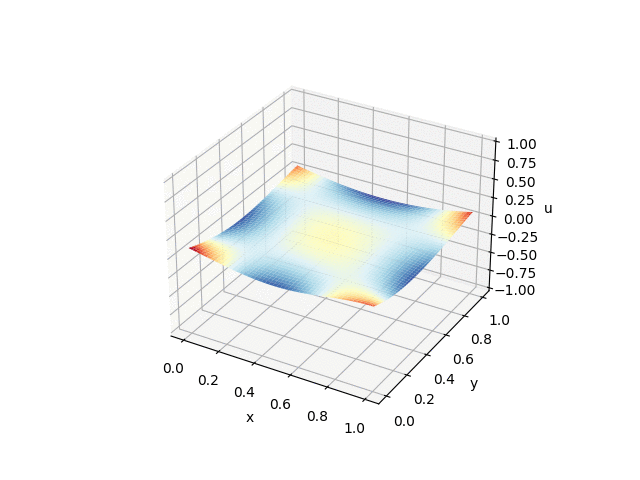

真解

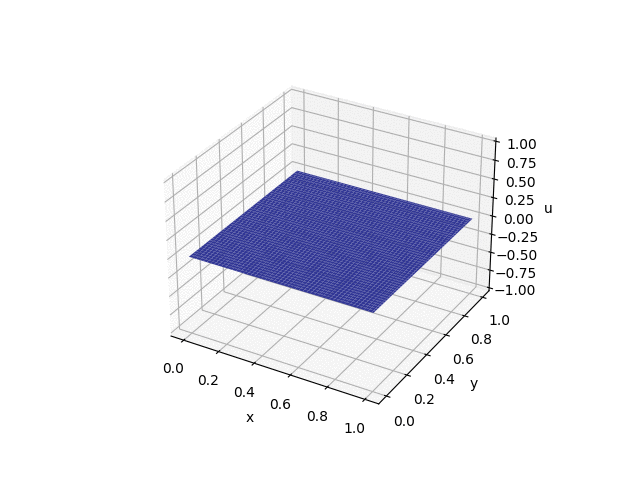

神经网络解

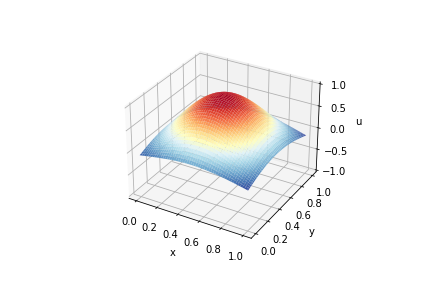

真解

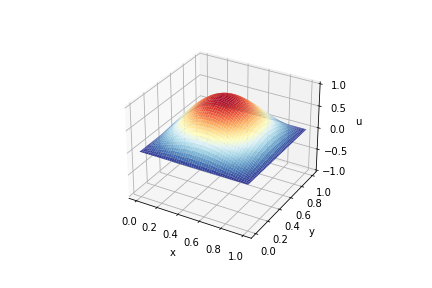